All Required Imports

In [26]:
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from PIL import Image
from tensorflow import keras
from keras import layers
import re

Splitting the Dataset/Defining the Dataset

In [27]:
test_low_light_images = sorted(glob("./All Datasets/Dark And Bright Dataset/dark/*"),
                               key=lambda x: int(re.search(r'\d+', x).group()))[825:] # Use [:] if you're just running the model and so want to just test the code

The Neural Network

In [33]:
def buildingOurNeuralNetwork():
    """Six Convolutional 2D Layers, 3 Concatenation Layers and 1 Finalizing Convolutional layer with 24 filters"""
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.Conv2D(32, (3,3), strides = (1,1), activation="relu", padding="same")(input_img)
    conv2 = layers.Conv2D(32, (3,3), strides = (1,1), activation="relu", padding="same")(conv1)
    conv3 = layers.Conv2D(32, (3,3), strides = (1,1), activation="relu", padding="same")(conv2)
    conv4 = layers.Conv2D(32, (3,3), strides = (1,1), activation="relu", padding="same")(conv3)
    int_conv1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(32, (3,3), strides = (1,1), activation="relu", padding="same")(int_conv1)
    int_conv2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(32, (3,3), strides = (1,1), activation="relu", padding="same")(int_conv2)
    int_conv3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3,3), strides=(1,1), activation="tanh", padding="same")(int_conv3)
    
    return keras.Model(inputs = input_img, outputs= x_r)

The ZeroDCE Class and our subclassed Model

In [28]:
class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        self.model = buildingOurNeuralNetwork()

    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate = learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")
    
    def get_enhanced_image(self, data, output):
        #multi stage non linear enhancement process
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]

        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)

        enhanced_image = x + r4 * (tf.square(x) - x)

        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)

        enhanced_image = x + r8 * (tf.square(x) - x)

        return enhanced_image
    
    def call(self, data):
        dce_net_output = self.model(data)
        return self.get_enhanced_image(data, dce_net_output)
    
    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination +
            loss_spatial_constancy +
            loss_color_constancy +
            loss_exposure
        )
        return {
            "total_loss" : total_loss,
            "illumination_smoothness_loss" : loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss" : loss_color_constancy,
            "exposure_loss" : loss_exposure,
        }
    
    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.model.trainable_weights
        )
        self.optimizer.apply_gradients(zip(gradients, self.model.trainable_weights))
        return losses
    
    def test_step(self, data):
        output = self.model(data)
        return self.compute_losses(data, output)
    
    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        self.model.save_weights(
            filepath, overwrite = overwrite, save_format = save_format, options = options
        )
    
    def load_weights(self, filepath, by_name = False, skip_mismatch=False, options=None):
        self.model.load_weights(
            filepath = filepath,
            by_name = by_name,
            skip_mismatch = skip_mismatch,
            options = options
        )

The loaded Model

In [29]:
loaded_model = ZeroDCE()

# Load the weights into the model
loaded_model.load_weights("C:\\mycode\\python\\Samsung Prism\\image_clarifyer_model1.h5")


Our Functions to Plot Result and to Understand the generated Images

In [30]:
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i+1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()


def infer(original_image):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = loaded_model(image) #commented for when running the saved-weight model
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

Calling the Model, and the functions 
No reference image here, this code is just to get the image enhanced by the model and the original image

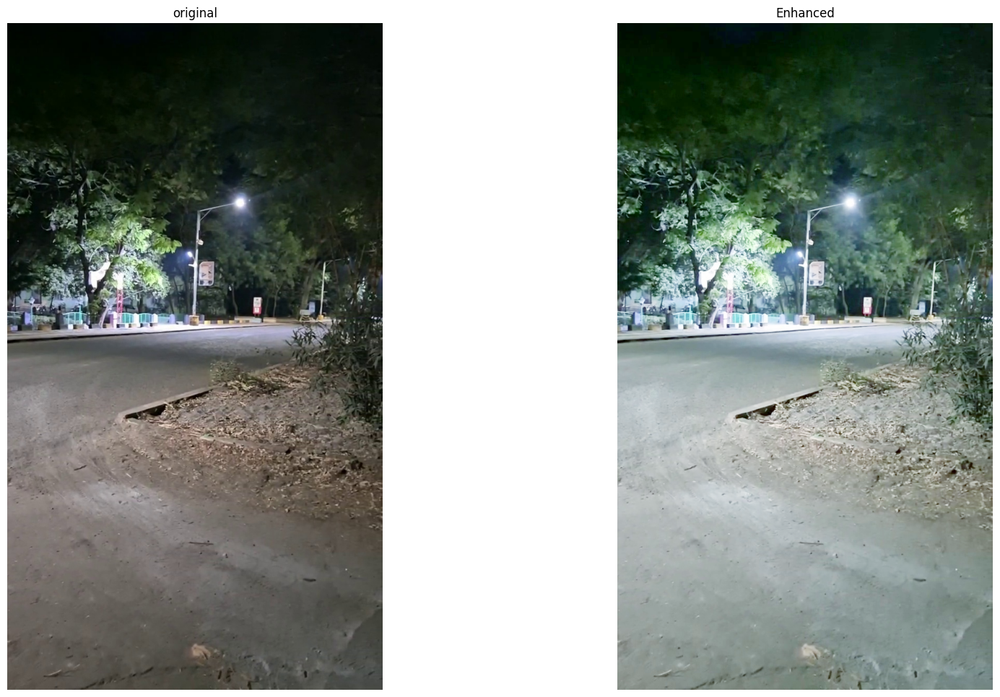

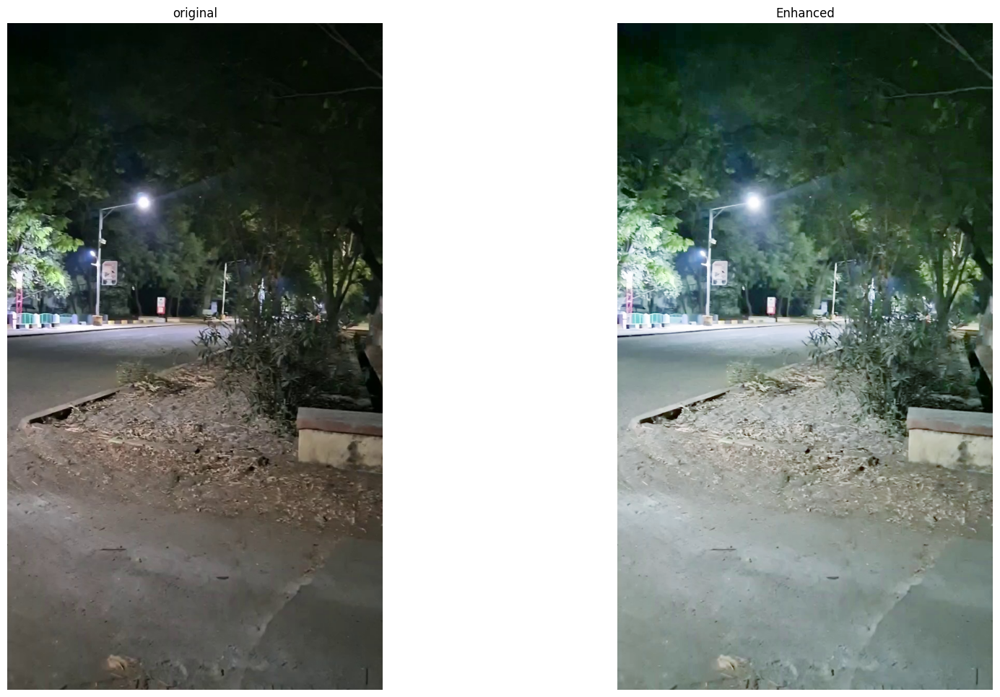

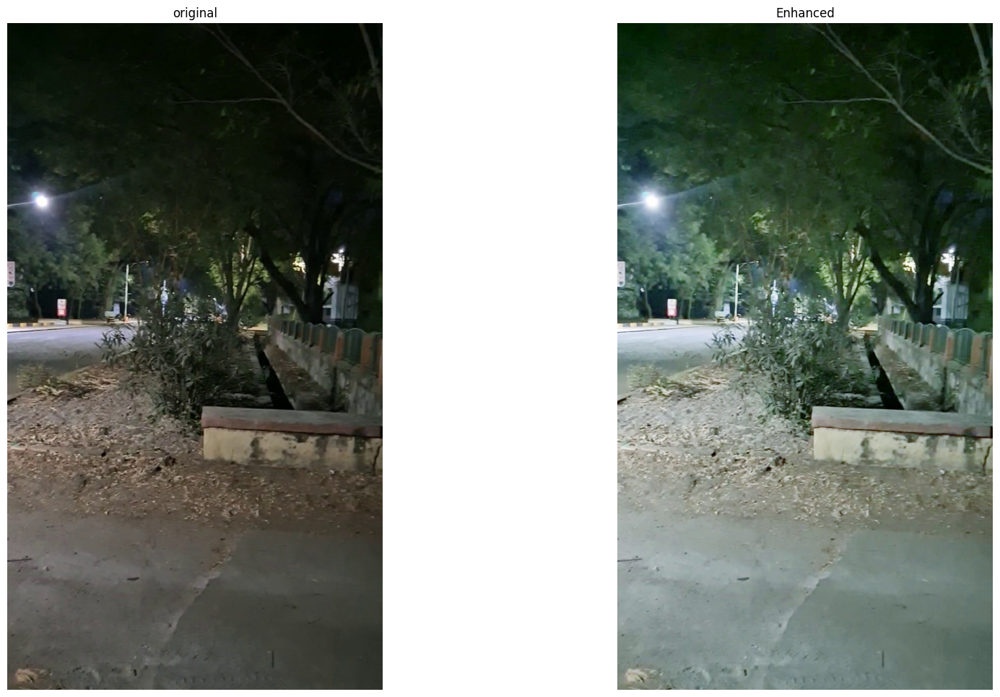

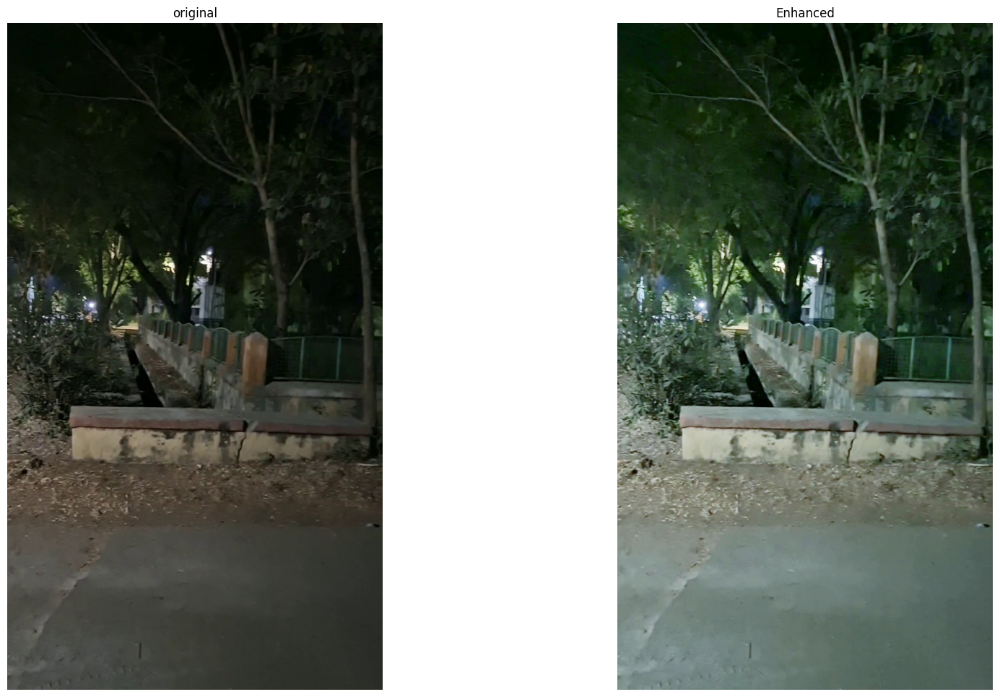

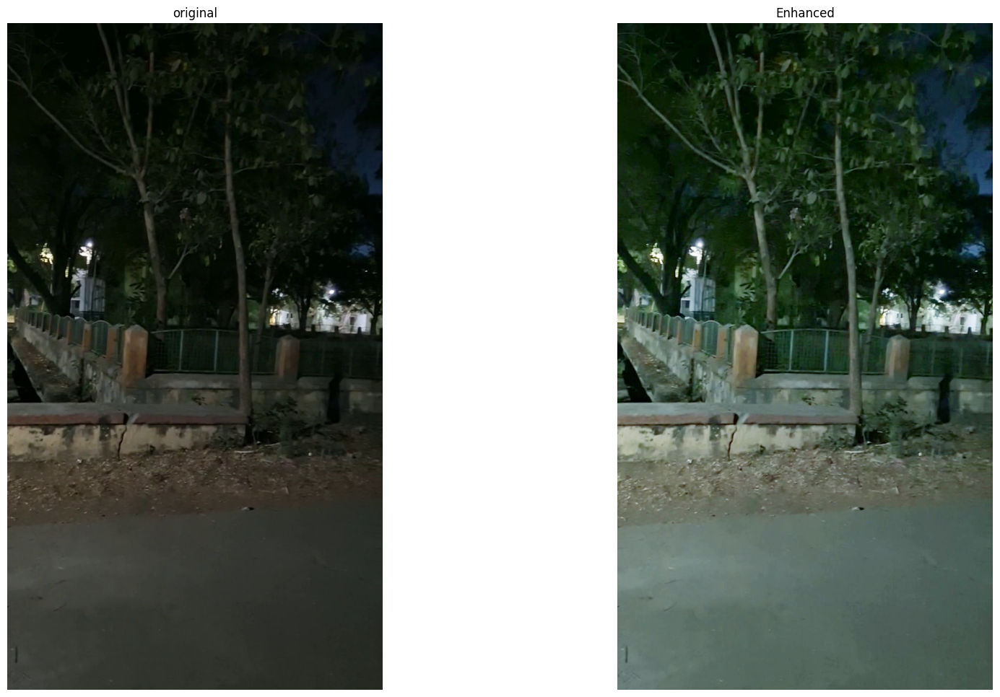

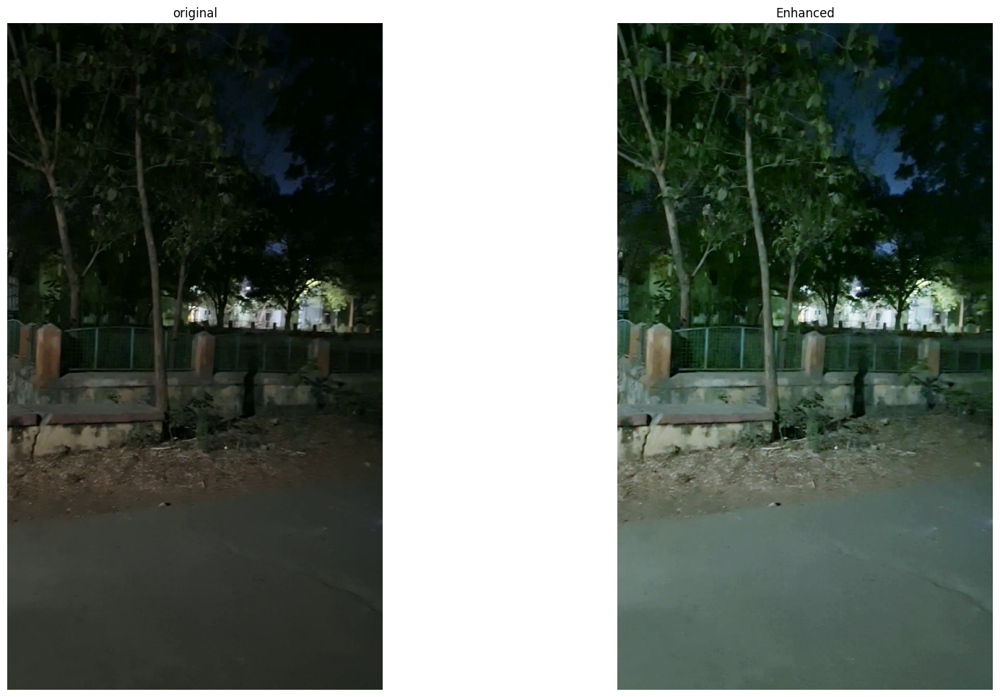

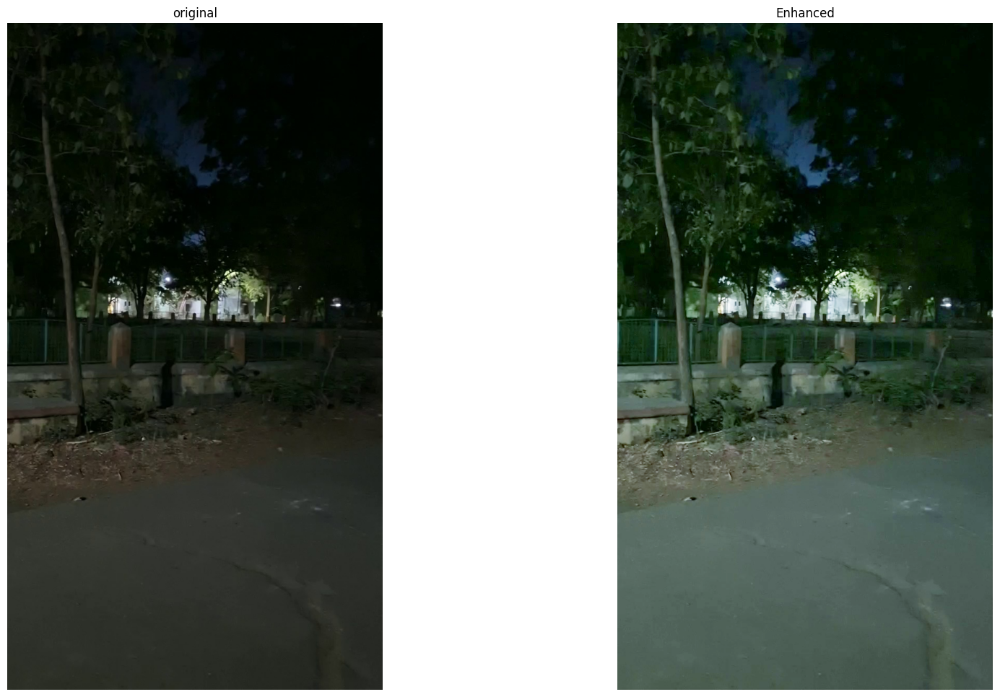

In [32]:
for val_image_file in test_low_light_images:
    original_image = Image.open(val_image_file)
    enhanced_image = infer(original_image)
    plot_results(
        [original_image ,enhanced_image],
        ["original", "Enhanced"],
        # [original_image, enhanced_image],
        # ["original", "Enhanced"],
        (20, 12,),
    )